In [1]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.integrate import solve_ivp
import networkx as nx
import matplotlib as mpl
import matplotlib.cm as cm
from itertools import product
from matplotlib.lines import Line2D
import random
import scipy.stats as stats
from tqdm import tqdm
from scipy import interpolate
from scipy import integrate
from scipy.interpolate import interp1d
import pandas as pd

## Functions:

In [11]:
# build matrix containing information about all the interactions on the network, including weights
# A is the full communication tensor Na No x Na No in dimension
def build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa):
    return np.kron(np.eye(Na), alpha * np.eye(No) + beta * Ao) + np.kron(Aa, gamma * np.eye(No) + delta * Ao)

def u_gauss(mu, dev, Na):
    u = np.zeros(Na)

    x = 0
    i = 0

    while i < Na:
        x = np.random.normal(mu, dev)
        if x > 0:
            u[i] = x
            i = i + 1
        else:
            i = i

    print(u)
    return u


# function for creating a vector with only positive u and with mean = mu of the gaussian:
def u_gauss2(mu, dev, Na):
    u = np.zeros(Na)

    x = 0
    i = 0
    while i < Na:
        x = np.random.normal(mu, dev)
        if x > 0:
            u[i] = x
            i = i + 1
        else:
            i = i

    mean_diff = np.mean(u) - mu
    u = u - mean_diff

    if np.all(u > 0):
        return u

    return u_gauss2(mu, dev, Na)

def plot_agent_label(Tmin, Tmax, zs, Na, No):
    t = np.linspace(Tmin,Tmax,Tmax) # start, stop, number of samples
    z = zs.sol(t) 
    
    idxs = No*np.array(range(Na))
    
    for i in range(No):
        plt.figure(i)
        option_ind = idxs + i*np.ones(Na)
        plt.plot(t,z.T[:,option_ind.astype(int)])
        plt.title('Option ' + str(i+1))
        plt.xlabel('t')
        plt.ylabel('z_ij')
        labels = []
        for j in range(Na):
            labels.append('Agent' + str(j+1))
        plt.legend(labels)
        
# plot of the focus on 1 single plot
def plot_agent_tot(zs1, zs2, Na):

    for i in range(Na):
        plt.plot(zs1, zs2[i], label=f'Agent {i+1}')

    plt.xlabel('t')
    plt.ylabel('task 2 <------ a_i ------> task 1')
    plt.title('Focus of the agents')
    if Na < 11:
        plt.legend()
        plt.show()
    else:
        plt.show()
        
def plot_agent_tot1(zs1, zs2, Na, ul):

    for i in range(Na):
        plt.plot(zs1, zs2[i], label=f'Agent {i+ 1}, u = {ul[i]}')
    
    #plt.xlabel('t')
    #plt.ylabel('task 2 <------ a_i ------> task 1')
    #plt.title('Focus of the agents')
    if Na < 11:
        plt.legend(loc = 0.0)
        plt.show()
    else:
        plt.show()
        
        
def plot_agent_tot2(zs1, zs2, Na, ul, **kwargs):

    for i in range(Na):
        plt.plot(zs1, zs2[i], color = colors[i], label=f'Agent {i+ 1}, g = {ul[i]}', **kwargs)
    
    #plt.xlabel('t')
    #plt.ylabel('task 2 <------ a_i ------> task 1')
    #plt.title('Focus of the agents')
    if Na < 11:
        plt.legend(loc = (0, -0.6), ncols = 1, fancybox = True, shadow = True)
        #plt.show()
    #else:
        #plt.show()

In [24]:
def f_64(t):
    return np.array(t).astype(np.float64)

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

def sim_net1(z, T, Na, No, d, A, u1, u2, rate, percent, value, times):
    
    b = []
    
    Tt = T - 200
    nb = int(rate*Tt) #nb of task switches
    
    #definition of the biases:
    for i in range(nb + 1):
        
        if i == 0:
            b_i = np.zeros(Na*No) * bias_w
        elif i != 0 and i % 2 != 0:
            b_i = generate_bias_vector_m(Na, No, percent, value, even=True) * bias_w
        elif i != 0 and i % 2 == 0:
            b_i = generate_bias_vector_m(Na, No, percent, value, even=False) * bias_w
        
        b.append(b_i)
    
    def f(t, z):
    
        if t != T:
            fi, se = find_indices_between_elements(times, t)
            return zdot_net1(t, z, Na, No, d, A, u1, u2, b[fi])
            
        if t == T:
            fi, se = find_indices_between_elements(times, t)
            return zdot_net1(t, z, Na, No, d, A, u1, u2, b[fi-1])
            
    zs = solve_ivp(f, [0, T], z, dense_output=False, t_eval=np.linspace(0, T, 200), max_step=1000, method="Radau")
    #zs = solve_ivp(f, [0, T], z, t_eval=np.linspace(0, T, 200), atol=1e-8, rtol=1e-8)
    #zs = solve_ivp(f,[0,T],z, dense_output=False, t_eval = np.linspace(0,T,200))
    
    return zs

In [4]:
#generate bias vector with tot percent of people with value != 0 on both task:
def generate_bias_vector_m(Na, No, percent, value, even=True):
    
    num_ones = int(Na * percent / 100)
    
    
    bias_vector = np.zeros(Na * No)
    
    
    indices = np.arange(Na * No)
    indicesminus = np.arange(Na * No)
    if even:
        indices = indices[indices % 2 == 0]  
        indicesminus = indicesminus[indicesminus % 2 != 0]
    else:
        indices = indices[indices % 2 != 0]  
        indicesminus = indicesminus[indicesminus % 2 == 0]
    
    bias_vector[indices[:num_ones]] = value
    bias_vector[indicesminus[:num_ones]] = -value
    
    return bias_vector

#funzione per trovare time window corretta
def find_indices_between_elements(arr, t):
    # Inizializza gli indici a None
    first_index = None
    second_index = None

    for i, element in enumerate(arr):
        if element <= t:
            # Trova l'indice più vicino a t
            first_index = i
        else:
            # L'elemento successivo è maggiore di t, quindi usciamo dal ciclo
            break

    if first_index is not None:
        # Calcola l'indice successivo a first_index
        second_index = first_index + 1

    return first_index, second_index

#funzione per creare vettore thresholds regolari
def find_thresh(T, rate):
    
    times = [0.0, 200.0]
    Tt = T - 200
    
    nb = int(rate*Tt) #nb of task switches
        
    #regular time interval:
    t_int = Tt / nb
    
    t_i = 200.0
    for j in range(nb):
        t_i += t_int
        times.append(t_i)
    
    return times

#funzione per creare vettore thresholds con t poissoniani
def find_thresh_p(T, rate):
    
    time_thresh = [0.0, 200.0]
    
    Tt = T - 200
    nb = int(rate*Tt) 
    
    # Poisson process for bias time intervals
    t = 200.0
    while t < T:
        t += np.random.exponential(1.0/rate)  # Generate time intervals according to Poisson process
        if t <= T:
            time_thresh.append(t)
    
    if len(time_thresh)-1 == nb:
        return time_thresh
    else:
        return find_thresh_p(T, rate)

    
# function to pass from a vector Na*No to a vector of Na
def new_zs(zs, Na, No):
    n2 = zs.shape[1]
    zsn = np.zeros((Na, n2))
    j = i = 0
    for i in range(0, Na * No, 2):
        zsn[j] = (zs[i] - zs[i + 1]) / 2.0
        j = j + 1

    return zsn

In [5]:
# model similar to anastasia's one (old functions)

def zdot_net1_old(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO[inds] = A[inds]
    A_SO = A_SO

    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F *( 1.0/tau)

    # variation of state vector z respect time
    proj = np.eye(Na * No)
    dz = np.dot(proj, F)
    return dz


#funzione con biases a t regolari

def sim_net1_old(z, T, Na, No, d, A, u1, u2, rate, percent, value, times):
    
    b = []
    
    Tt = T - 200
    nb = int(rate*Tt) #nb of task switches
    
    #definition of the biases:
    for i in range(nb + 1):
        
        if i == 0:
            b_i = np.zeros(Na*No) * bias_w
        elif i != 0 and i % 2 != 0:
            b_i = generate_bias_vector_m(Na, No, percent, value, even=True) * bias_w
        elif i != 0 and i % 2 == 0:
            b_i = generate_bias_vector_m(Na, No, percent, value, even=False) * bias_w
        
        b.append(b_i)
    
    def f(t, z):
    
        if t != T:
            fi, se = find_indices_between_elements(times, t)
            return zdot_net1(t, z, Na, No, d, A, u1, u2, b[fi])
            
        if t == T:
            fi, se = find_indices_between_elements(times, t)
            return zdot_net1(t, z, Na, No, d, A, u1, u2, b[fi-1])
            
    zs = solve_ivp(f, [0, T], z, dense_output=True, t_eval=np.linspace(0, T, 200), max_step=1000)
    
    return zs

## Case study:

In [12]:
# case 4 agents:

Na = 4  # number of agents
No = 2  # number of tasks

#null initial conditions
z0 = np.zeros(Na*No)
#z0 = np.random.randn(Na * No) * 0.0 

z = z0
z1 = z0

# simulation run time
T = 2200

Tmin = 0
Tmax = 2200

# model parameters
d = 0.2
alpha = 0.02
beta = 0.01
gamma = 0.02
delta = 0.0
tau = 10
ue = 1

# Matrices
Ao = np.array([[1, -1], [-1, 1]])  # incongruent stimuli
Aa = np.array([[0, 1, 1, 1], [1, 0, 1, 1], [1, 1, 0, 1], [1, 1, 1, 0]])  # only positive interaction and all agents connetcted

## Dynamics:

In [13]:
# build A
A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)

In [14]:
#Biases
bias_w = 0.1
value = 1
percent = 100

In [38]:
T = 2200
rate = 0.004

times = find_thresh(T, rate)

In [39]:
times

[0.0, 200.0, 450.0, 700.0, 950.0, 1200.0, 1450.0, 1700.0, 1950.0, 2200.0]

#### Homogeneous/Hetrogeneous Group Plots:

In [33]:
colors = ['#4285F4','#0F9D58', '#F4B400','#DB4437']
import seaborn as sns  # Import seaborn

In [34]:
percent = 100

In [35]:
gamma = 0.02
A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)

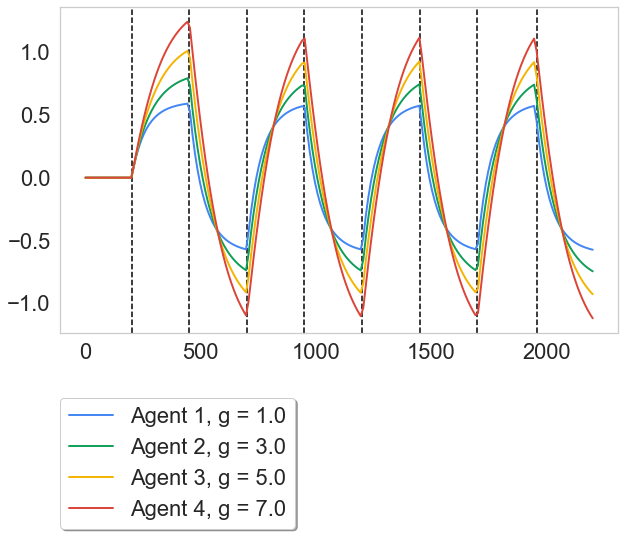

In [40]:
# Plot the data
lw = 1.5
plt.figure(figsize=(10, 6))
# Set the seaborn style
sns.set(font_scale=2.0)
sns.set_style("whitegrid")  # You can choose an appropriate seaborn style
plt.grid(False)
plt.axvline(x=200, color='black', linestyle='--', linewidth=lw)
plt.axvline(x=700, color='black', linestyle='--', linewidth=lw)
plt.axvline(x=1200, color='black', linestyle='--', linewidth=lw)
plt.axvline(x=1700, color='black', linestyle='--', linewidth=lw)
plt.axvline(x=450, color='black', linestyle='--', linewidth=lw)
plt.axvline(x=950, color='black', linestyle='--', linewidth=lw)
plt.axvline(x=1450, color='black', linestyle='--', linewidth=lw)
plt.axvline(x=1959, color='black', linestyle='--', linewidth=lw)

ul = [1.0, 3.0, 5.0, 7.0]
#ul = [4.0, 4.0, 4.0, 4.0]
u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
#u  = np.array([4.0, 4.0, 4.0, 4.0]).repeat(2)
A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
z = z1
zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)

plot_agent_tot2(zs.t, zs.y, Na, ul, linewidth=lw *1.3)
#plot_agent_label(Tmin, Tmax, zs, Na, No)
plt.savefig('C:/Users/aless/OneDrive/Desktop/TESI/immagini paper cogsci/immagine_i.png', dpi=400, bbox_inches='tight', pad_inches=0.5)
plt.show()
#plt.savefig('C:/Users/aless/OneDrive/Desktop/TESI/immagini paper cogsci/immagine1.png', dpi=300, bbox_inches='tight', pad_inches=0.5)

### Homogeneous group analysis

In [57]:
percent = 100
gamma = 0.02
A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)

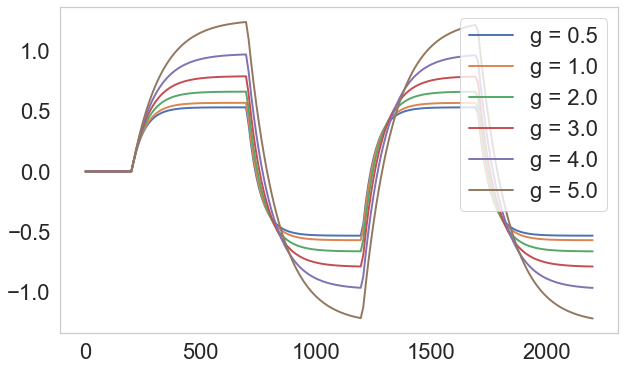

In [58]:
#comparation between different hom groups (u)

# Plot the data
lw = 1.5
plt.figure(figsize=(10, 6))
# Set the seaborn style
sns.set(font_scale=2.0)
sns.set_style("whitegrid")  # You can choose an appropriate seaborn style
plt.grid(False)

u_values = [0.5, 1.0, 2.0, 3.0, 4.0, 5.0] 
ul = [0.5, 1.0, 2.0, 3.0, 4.0, 5.0]

# Inizializza una lista vuota per i risultati
results = []

for u in u_values:
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))
    
# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"g = {u_values[i]}"  # Crea una legenda con il valore di "u"
    plt.plot(t, y, label=label, linewidth=lw *1.3)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()


#plot_agent_tot2(zs.t, zs.y, Na, ul, linewidth=lw *1.3)
#plt.savefig('C:/Users/aless/OneDrive/Desktop/TESI/immagini paper cogsci/immagine_h.png', dpi=400, bbox_inches='tight', pad_inches=0.5)
#plt.show()

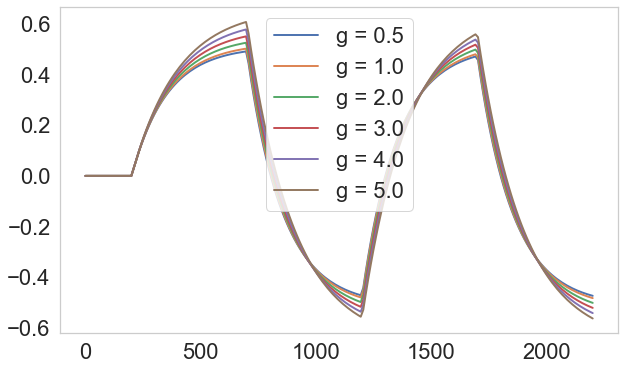

In [59]:
#comparation between different hom groups (u) with gamma = 0 -> individual evolution
# Plot the data
lw = 1.5
plt.figure(figsize=(10, 6))
# Set the seaborn style
sns.set(font_scale=2.0)
sns.set_style("whitegrid")  # You can choose an appropriate seaborn style
plt.grid(False)

gamma = 0.0
tau = 30
# Lista dei valori di "u" da testare
u_values = [0.5, 1.0, 2.0, 3.0, 4.0, 5.0]  

# Inizializza una lista vuota per i risultati
results = []

for u in u_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"g = {u_values[i]}"  # Crea una legenda con il valore di "u"
    plt.plot(t, y, label=label, linewidth=lw *1.3)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [60]:
gamma = 0.02
tau = 10

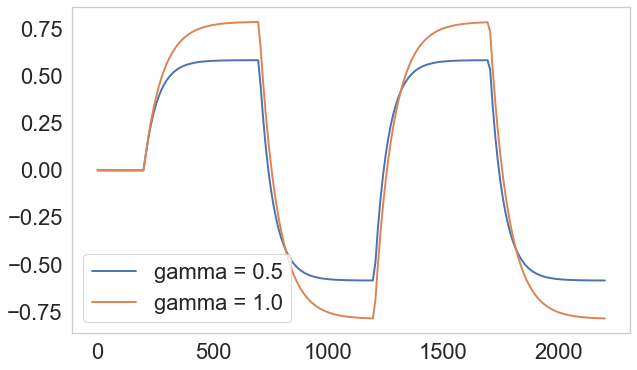

In [61]:
#comparation between hom group vs single agents
# Plot the data
lw = 1.5
plt.figure(figsize=(10, 6))
# Set the seaborn style
sns.set(font_scale=2.0)
sns.set_style("whitegrid")  # You can choose an appropriate seaborn style
plt.grid(False)

u = 3.0 

# Lista dei valori di "u" da testare
gamma_values = [0.0, 0.02]  

# Inizializza una lista vuota per i risultati
results = []

for gamma in gamma_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"gamma = {gamma_values[i]}"  # Crea una legenda con il valore di "u"
    plt.plot(t, y, label=label, linewidth=lw *1.3)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

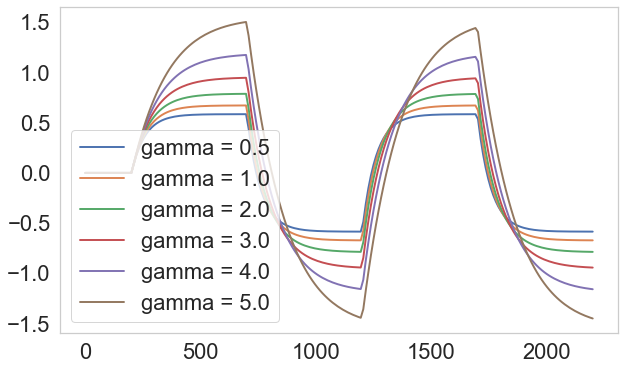

In [62]:
#Effect of parameter gamma
# Plot the data
lw = 1.5
plt.figure(figsize=(10, 6))
# Set the seaborn style
sns.set(font_scale=2.0)
sns.set_style("whitegrid")  # You can choose an appropriate seaborn style
plt.grid(False)

u = 3.0 

# Lista dei valori di "u" da testare
gamma_values = [0.0, 0.01, 0.02, 0.03, 0.04, 0.05]  

# Inizializza una lista vuota per i risultati
results = []

for gamma in gamma_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"gamma = {gamma_values[i]}"  # Crea una legenda con il valore di "u"
    plt.plot(t, y, label=label, linewidth=lw *1.3)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [63]:
gamma = 0.02
gamma

0.02

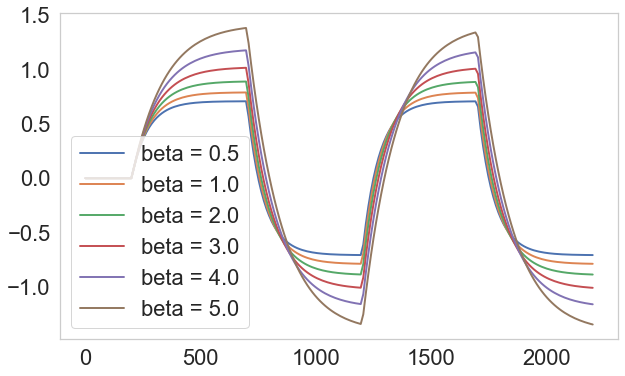

In [66]:
#Effect of parameter beta
lw = 1.5
plt.figure(figsize=(10, 6))
# Set the seaborn style
sns.set(font_scale=2.0)
sns.set_style("whitegrid")  # You can choose an appropriate seaborn style
plt.grid(False)

u = 3.0 

# Lista dei valori di "u" da testare
beta_values = [0.0, 0.01, 0.02, 0.03, 0.04, 0.05]  

# Inizializza una lista vuota per i risultati
results = []

for beta in beta_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"beta = {beta_values[i]}"  
    plt.plot(t, y, label=label, linewidth=lw *1.3)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [31]:
beta = 0.01
beta

0.01

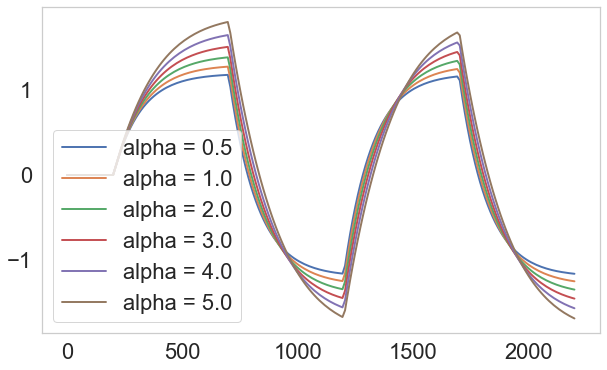

In [68]:
#Effect of parameter alfa
lw = 1.5
plt.figure(figsize=(10, 6))
# Set the seaborn style
sns.set(font_scale=2.0)
sns.set_style("whitegrid")  # You can choose an appropriate seaborn style
plt.grid(False)

u = 3.0 

# Lista dei valori di "u" da testare
alpha_values = [0.0, 0.01, 0.02, 0.03, 0.04, 0.05]  

# Inizializza una lista vuota per i risultati
results = []

for alpha in alpha_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"alpha = {alpha_values[i]}"  
    plt.plot(t, y, label=label, linewidth=lw *1.3)


# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [69]:
alpha = 0.02
alpha

0.02

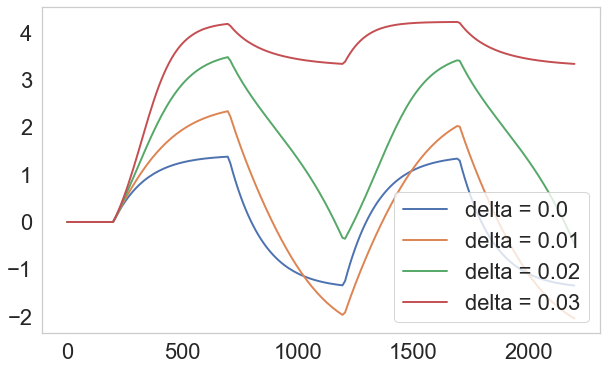

In [70]:
#Effect of parameter delta
lw = 1.5
plt.figure(figsize=(10, 6))
# Set the seaborn style
sns.set(font_scale=2.0)
sns.set_style("whitegrid")  # You can choose an appropriate seaborn style
plt.grid(False)

u = 3.0 

# Lista dei valori di "u" da testare
delta_values = [0.0, 0.01, 0.02, 0.03]  

# Inizializza una lista vuota per i risultati
results = []

for delta in delta_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"delta = {delta_values[i]}"  
    plt.plot(t, y, label=label, linewidth=lw *1.3)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [71]:
delta = 0.0

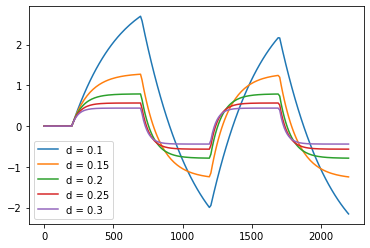

In [36]:
#Effect of parameter d

u = 3.0 

# Lista dei valori di "u" da testare
d_values = [0.1, 0.15, 0.2, 0.25, 0.3]  

# Inizializza una lista vuota per i risultati
results = []

for d in d_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"d = {d_values[i]}"  
    plt.plot(t, y, label=label)
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [37]:
d = 0.2

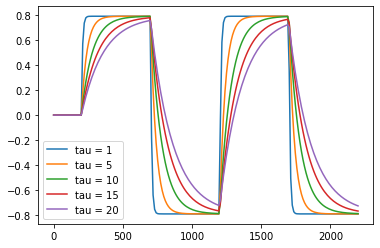

In [38]:
#Effect of parameter tau

u = 3.0 

# Lista dei valori di "u" da testare
tau_values = [1, 5, 10, 15, 20]  

# Inizializza una lista vuota per i risultati
results = []

for tau in tau_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"tau = {tau_values[i]}"  
    plt.plot(t, y, label=label)
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [39]:
tau = 10

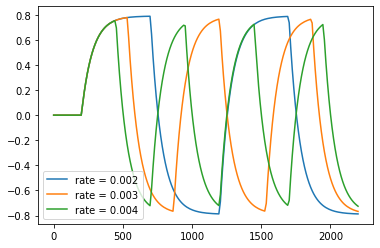

In [40]:
#Effect of the rate

u = 3.0 

# Lista dei valori di "u" da testare

rate_values = [0.002, 0.003, 0.004]  

# Inizializza una lista vuota per i risultati
results = []

for rate in rate_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    times = find_thresh(T, rate)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"rate = {rate_values[i]}"  
    plt.plot(t, y, label=label)
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

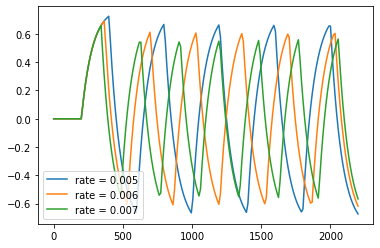

In [41]:
#Effect of the rate

u = 3.0 

# Lista dei valori di "u" da testare

rate_values = [0.005, 0.006, 0.007]  

# Inizializza una lista vuota per i risultati
results = []

for rate in rate_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    times = find_thresh(T, rate)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"rate = {rate_values[i]}"  
    plt.plot(t, y, label=label)
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [42]:
rate = 0.002
times = find_thresh(T, rate)

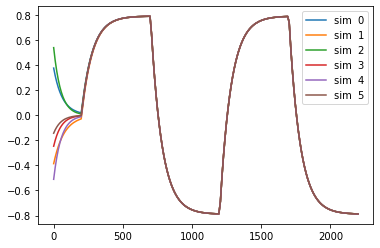

In [43]:
z0 = np.random.randn(Na * No) * 0.0
#Effect of z0

u = 3.0 

# Inizializza una lista vuota per i risultati
results = []

n = 0
for n in range(6):
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    z1 = np.random.randn(Na * No)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"sim  {i}"  
    plt.plot(t, y, label=label)
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [44]:
z0 = np.zeros(Na*No) 
z = z0
z1 = z0

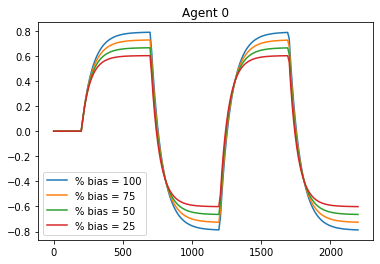

In [47]:
#comparation between different nb of biases

u = 3.0
gamma = 0.02

# Lista dei valori di "u" da testare
percent_values = [100, 75, 50, 25]  

# Inizializza una lista vuota per i risultati
results = []

for percent in percent_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0])) #CHANGE HERE THE AGENT

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"% bias = {percent_values[i]}"  # Crea una legenda con il valore di "u"
    plt.plot(t, y, label=label)
plt.title(f"Agent {0}")
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

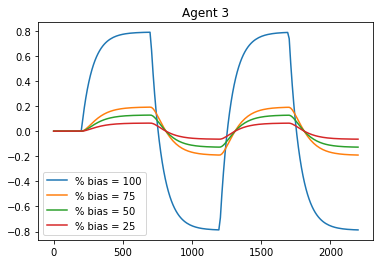

In [48]:
#comparation between different nb of biases

u = 3.0
gamma = 0.02

# Lista dei valori di "u" da testare
percent_values = [100, 75, 50, 25]  

# Inizializza una lista vuota per i risultati
results = []

for percent in percent_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[3])) #CHANGE HERE THE AGENT

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"% bias = {percent_values[i]}"  # Crea una legenda con il valore di "u"
    plt.plot(t, y, label=label)
plt.title(f"Agent {3}")
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

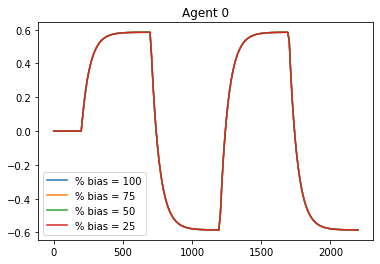

In [23]:
#comparation between different nb of biases with gamma = 0

u = 3.0
gamma = 0.0
tau = 10

# Lista dei valori di "u" da testare
percent_values = [100, 75, 50, 25]  

# Inizializza una lista vuota per i risultati
results = []

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
for percent in percent_values:
    #A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0])) #CHANGE HERE THE AGENT

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"% bias = {percent_values[i]}"  
    plt.plot(t, y, label=label)
    #plot_agent_tot(t, y, Na)

plt.title(f"Agent {0}")
# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

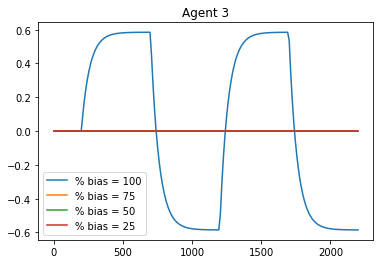

In [50]:
#comparation between different nb of biases with gamma = 0

u = 3.0
gamma = 0.0
tau = 10

# Lista dei valori di "u" da testare
percent_values = [100, 75, 50, 25]  

# Inizializza una lista vuota per i risultati
results = []

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
for percent in percent_values:
    #A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[3])) #CHANGE HERE THE AGENT

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"% bias = {percent_values[i]}"  
    plt.plot(t, y, label=label)
    #plot_agent_tot(t, y, Na)

plt.title(f"Agent {3}")
# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [51]:
gamma = 0.02
percent = 100
tau = 10

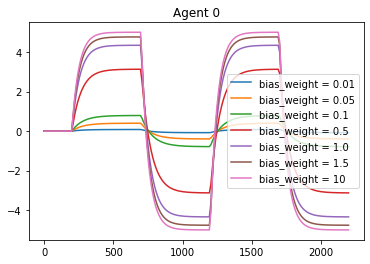

In [66]:
#comparation between different value of the biases

u = 3.0
gamma = 0.02

# Lista dei valori di "u" da testare
bias_w_values = [0.01, 0.05, 0.1, 0.5, 1.0, 1.5, 10]  

# Inizializza una lista vuota per i risultati
results = []

for bias_w in bias_w_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0])) #CHANGE HERE THE AGENT

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"bias_weight = {bias_w_values[i]}"  # Crea una legenda con il valore di "u"
    plt.plot(t, y, label=label)
plt.title(f"Agent {0}")
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [67]:
gamma = 0.02
bias_w = 0.1

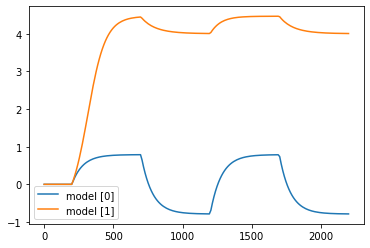

In [68]:
#comparation between model with normalization 1/Na or not

u = 3.0   

# Inizializza una lista vuota per i risultati
results = []

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y[0]))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    #F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"model {[i]}"  
    plt.plot(t, y, label=label)
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

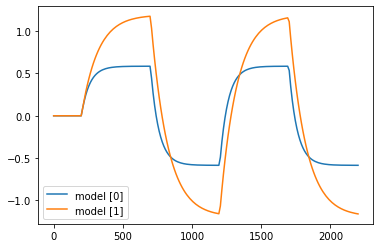

In [69]:
#comparation between model with normalization 1/Na or not, with gamma = 0.0

u = 3.0   
gamma = 0.0

# Inizializza una lista vuota per i risultati
results = []

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz


A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y[0]))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    #F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"model {[i]}"  
    plt.plot(t, y, label=label)
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [70]:
gamma = 0.02

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz


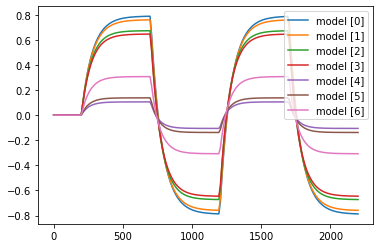

In [75]:
#comparation between model with different saturation functions

u = 3.0   
gamma = 0.02

# Inizializza una lista vuota per i risultati
results = []

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y[0]))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return 0.5 * np.tanh(2*z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y[0]))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return 0.25 * np.tanh(4*z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y[0]))


def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(x, u1):
        n = 1.0
        K = u1
        return (x ** n) / (K ** n + np.abs(x) ** n)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b, 1.0)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y[0]))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(x, u1):
        n = 1.0
        K = u1
        return (x ** n) / (K ** n + np.abs(x) ** n)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b, 5.0)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y[0]))


def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(x, u1):
        a = 1.0/u1
        return 2 / (1 + np.exp(-a * x)) - 1

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b, 2.0)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y[0]))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(x):
        return 2 / (1 + np.exp(-x)) - 1
    
    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y[0]))

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"model {[i]}"  
    plt.plot(t, y, label=label)
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [77]:
def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

##### Heterogeneous Group

In [15]:
times

[0.0, 200.0, 700.0, 1200.0, 1700.0, 2200.0]

In [16]:
percent = 100

In [17]:
colors = ['#4285F4','#0F9D58', '#F4B400','#DB4437']

In [18]:
def plot_agent_tot2(zs1, zs2, Na, ul, **kwargs):

    for i in range(Na):
        plt.plot(zs1, zs2[i], color = colors[i], label=f'Agent {i+ 1}, u = {ul[i]}', **kwargs)
    
    #plt.xlabel('t')
    #plt.ylabel('task 2 <------ a_i ------> task 1')
    #plt.title('Focus of the agents')
    if Na < 11:
        plt.legend(loc = (0, -0.6), ncols = 1, fancybox = True, shadow = True)
        #plt.show()
    #else:
        #plt.show()

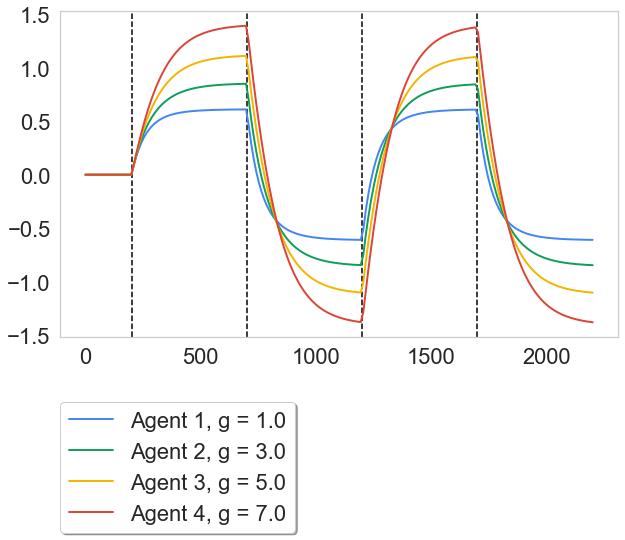

In [39]:
#single het group simulation
# Plot the data
lw = 1.5
plt.figure(figsize=(10, 6))
# Set the seaborn style
sns.set(font_scale=2.0)
sns.set_style("whitegrid")  # You can choose an appropriate seaborn style
plt.grid(False)
plt.axvline(x=200, color='black', linestyle='--', linewidth=lw)
plt.axvline(x=700, color='black', linestyle='--', linewidth=lw)
plt.axvline(x=1200, color='black', linestyle='--', linewidth=lw)
plt.axvline(x=1700, color='black', linestyle='--', linewidth=lw)

ul = [1.0, 3.0, 5.0, 7.0]
#ul = [3.0, 3.0, 3.0, 3.0]
u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
#u  = np.array([3.0, 3.0, 3.0, 3.0]).repeat(2)
A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
z = z1
zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)

plot_agent_tot2(zs.t, zs.y, Na, ul, linewidth=lw *1.3)
#plot_agent_label(Tmin, Tmax, zs, Na, No)
plt.savefig('C:/Users/aless/OneDrive/Desktop/TESI/immagini paper cogsci/immagine2.png', dpi=400, bbox_inches='tight', pad_inches=0.5)
plt.show()
#plt.savefig('C:/Users/aless/OneDrive/Desktop/TESI/immagini paper cogsci/immagine1.png', dpi=300, bbox_inches='tight', pad_inches=0.5)

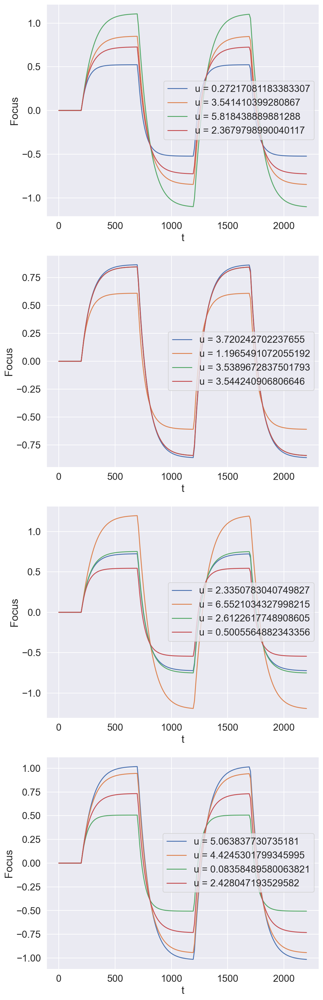

In [38]:
#comparation between different het groups (u)

n = 4
mu = 3
dev = 3

u_vectors = []
u_vec = []
for i in range(n):
    v = u_gauss2(mu, dev, Na)
    u_vec.append(v)
    v = v.repeat(2)
    u_vectors.append(v)

# Inizializza una lista vuota per i risultati
results = []

for u in u_vectors:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    z = z1
    zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(u_vectors)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u_vector, (t, y)) in enumerate(zip(u_vectors, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vec[i][j]}")
    #axs[i].set_title(f"Risultati per diversi valori di u")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()


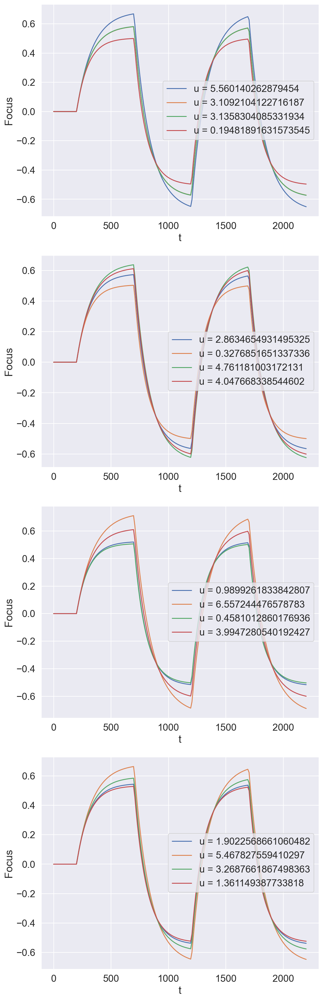

In [39]:
#comparation between different het groups (u) with gamma = 0 -> individual evolution

n = 4
mu = 3
dev = 3
gamma = 0.0
tau = 20

u_vectors = []
u_vec = []
for i in range(n):
    v = u_gauss2(mu, dev, Na)
    u_vec.append(v)
    v = v.repeat(2)
    u_vectors.append(v)

# Inizializza una lista vuota per i risultati
results = []

for u in u_vectors:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    z = z1
    zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(u_vectors)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u_vector, (t, y)) in enumerate(zip(u_vectors, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vec[i][j]}")
    #axs[i].set_title(f"Risultati per diversi valori di u")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()


In [43]:
gamma = 0.02

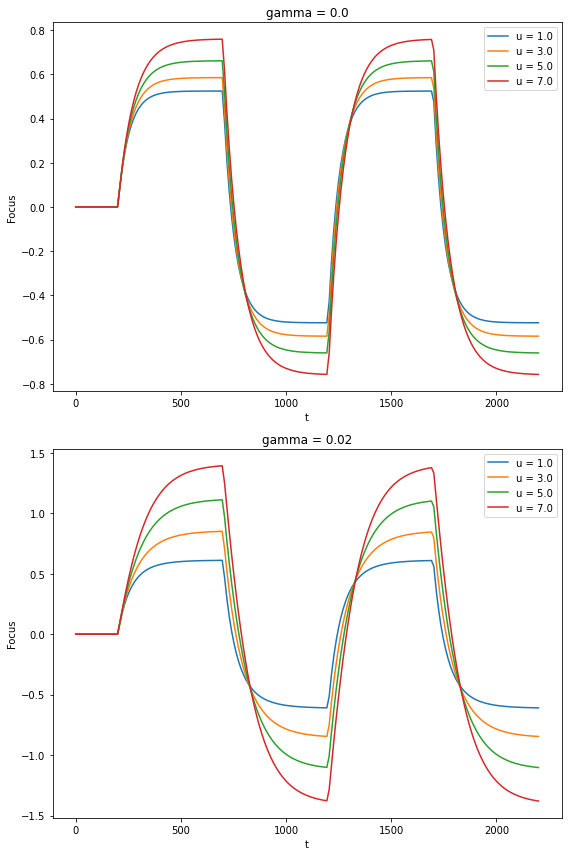

In [82]:
#comparation between het group vs single agents

tau = 10

gamma_values = [0.0, 0.02]
u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]

# Inizializza una lista vuota per i risultati
results = []

for gamma in gamma_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    z = z1
    zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(gamma_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(gamma_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"gamma = {gamma_values[i]}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

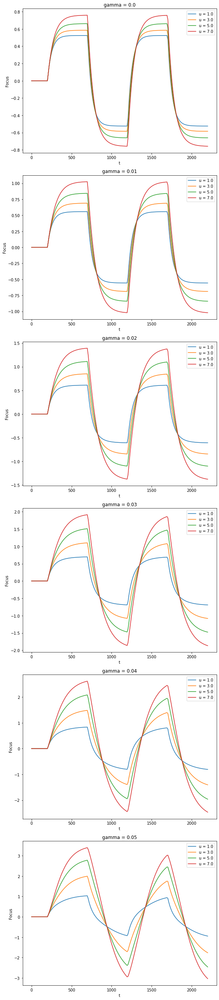

In [84]:
#Effect of parameter gamma

gamma_values = [0.0, 0.01, 0.02, 0.03, 0.04, 0.05] 
u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]

# Inizializza una lista vuota per i risultati
results = []

for gamma in gamma_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    z = z1
    zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(gamma_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(gamma_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"gamma = {gamma_values[i]}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

In [85]:
gamma = 0.02

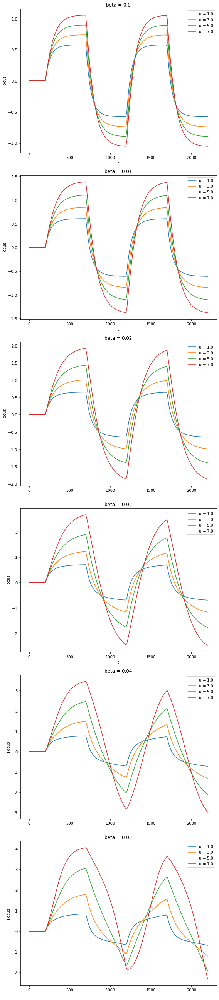

In [86]:
#Effect of parameter beta

# Lista dei valori di "u" da testare
beta_values = [0.0, 0.01, 0.02, 0.03, 0.04, 0.05]  

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]

# Inizializza una lista vuota per i risultati
results = []

for beta in beta_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    z = z1
    zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(beta_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(beta_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"beta = {beta_values[i]}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

In [87]:
beta = 0.01

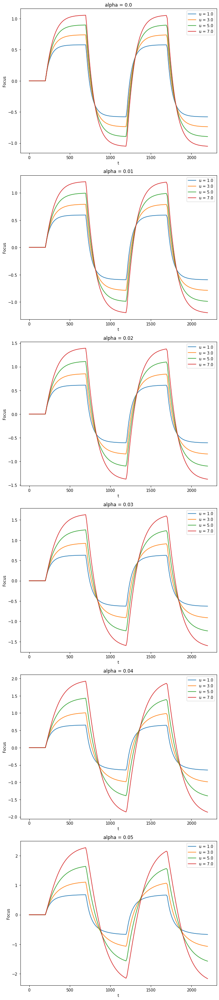

In [88]:
#Effect of parameter alfa

# Lista dei valori di "u" da testare
alpha_values = [0.0, 0.01, 0.02, 0.03, 0.04, 0.05]  

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]

# Inizializza una lista vuota per i risultati
results = []

for alpha in alpha_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    z = z1
    zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(alpha_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(alpha_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"alpha = {alpha_values[i]}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

In [89]:
alpha = 0.02

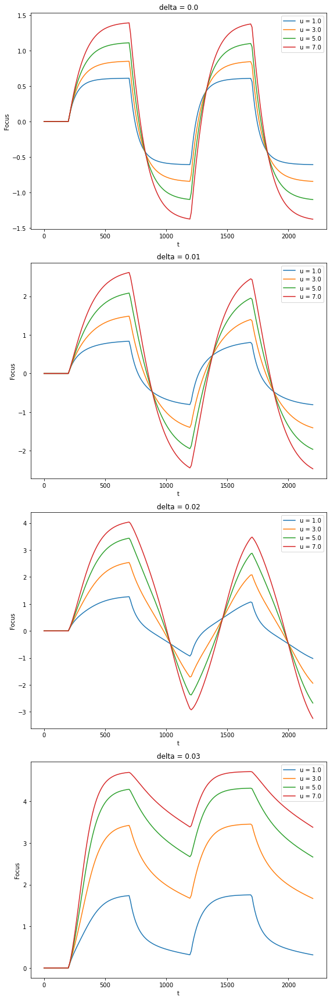

In [90]:
#Effect of parameter delta

# Lista dei valori di "u" da testare
delta_values = [0.0, 0.01, 0.02, 0.03]  

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]

# Inizializza una lista vuota per i risultati
results = []

for delta in delta_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    z = z1
    zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(delta_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(delta_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"delta = {delta_values[i]}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

In [91]:
delta = 0.0

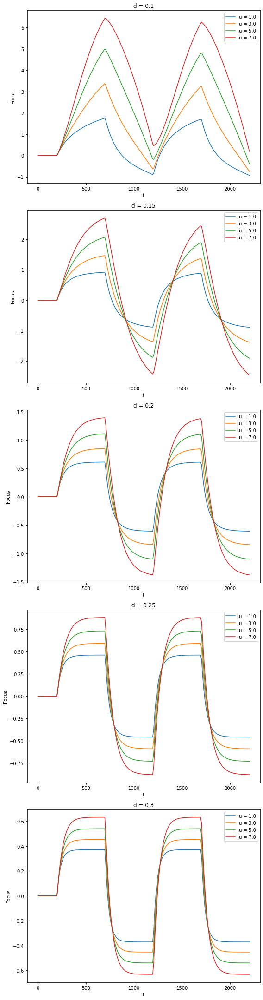

In [92]:
#Effect of parameter d

# Lista dei valori di "u" da testare
d_values = [0.1, 0.15, 0.2, 0.25, 0.3]  

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]

# Inizializza una lista vuota per i risultati
results = []

for d in d_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    z = z1
    zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(d_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(d_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"d = {d_values[i]}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

In [93]:
d = 0.2

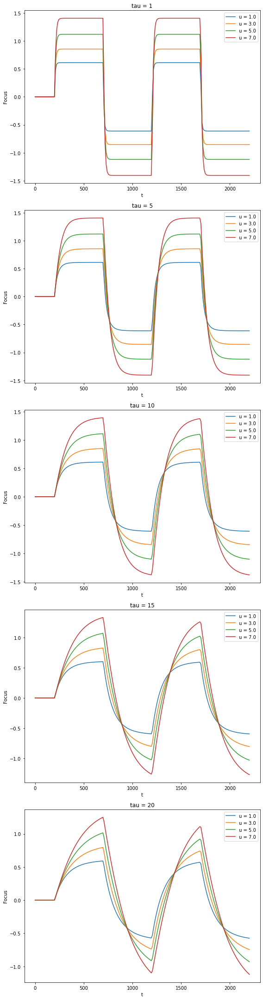

In [94]:
#Effect of parameter tau

# Lista dei valori di "u" da testare
tau_values = [1, 5, 10, 15, 20]  

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]

# Inizializza una lista vuota per i risultati
results = []

for tau in tau_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    z = z1
    zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(tau_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(tau_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"tau = {tau_values[i]}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

In [18]:
tau = 10

<Figure size 720x432 with 0 Axes>

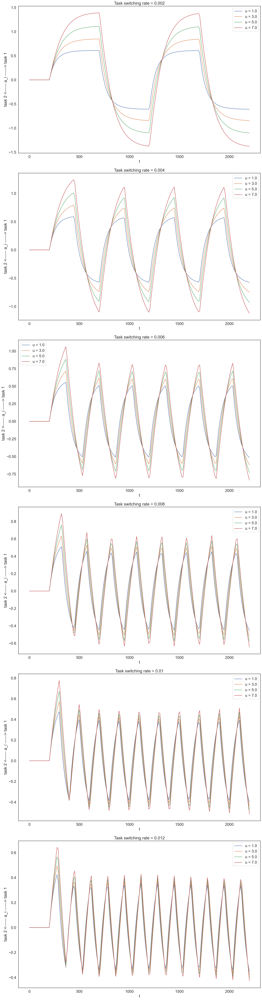

In [35]:
#Effect of the rate
plt.figure(figsize=(10, 6))
sns.set(font_scale=1.5)
sns.set_style("white")
# Lista dei valori di "u" da testare

#rate_values = [0.002, 0.003, 0.004, 0.005, 0.006, 0.007] 
rate_values = [0.002, 0.004, 0.006, 0.008, 0.010, 0.012] 

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]

# Inizializza una lista vuota per i risultati
results = []

for rate in rate_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    times = find_thresh(T, rate)
    z = z1
    zs = sim_net1(z, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(rate_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(16, 10 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(rate_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"Task switching rate = {rate_values[i]}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("task 2 <------ a_i ------> task 1")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

In [21]:
rate = 0.002
times = find_thresh(T, rate)

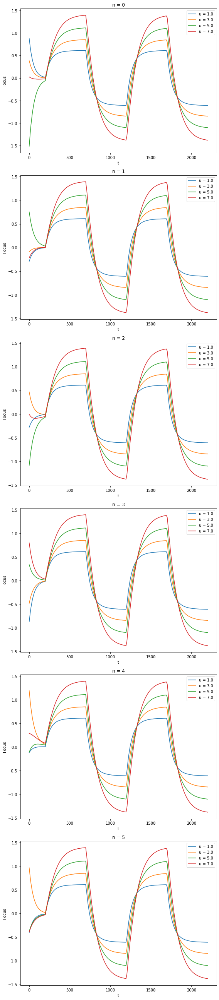

In [98]:
#Effect of z0

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]

# Inizializza una lista vuota per i risultati
results = []
z_values = []

n = 0
for n in range(6):
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    z1 = np.random.randn(Na * No)
    z_values.append(z1)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(z_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(z_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"n = {i}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

In [99]:
z0 = np.zeros(Na*No) 
z = z0
z1 = z0

<Figure size 720x432 with 0 Axes>

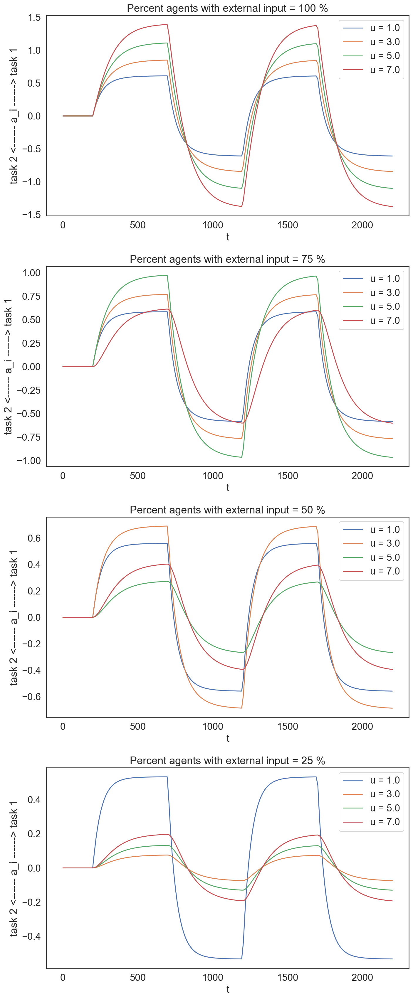

In [29]:
#comparation between different nb of biases
# Plot the data
plt.figure(figsize=(10, 6))
sns.set(font_scale=1.5)
sns.set_style("white")  # You can choose an appropriate seaborn style
#plt.grid(False)

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]
gamma = 0.02

# Lista dei valori di "u" da testare
percent_values = [100, 75, 50, 25]  

# Inizializza una lista vuota per i risultati
results = []

for percent in percent_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(percent_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(10, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(percent_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    #axs[i].axvline(x=200, color='black', linestyle='--', linewidth=1)
    #axs[i].axvline(x=700, color='black', linestyle='--', linewidth=1)
    #axs[i].axvline(x=1200, color='black', linestyle='--', linewidth=1)
    #axs[i].axvline(x=1700, color='black', linestyle='--', linewidth=1)
    axs[i].set_title(f"Percent agents with external input = {percent_values[i]} %")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("task 2 <------ a_i ------> task 1")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

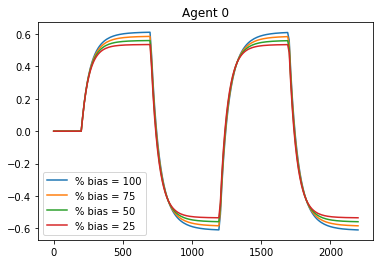

In [108]:
#comparation between different nb of biases

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]
gamma = 0.02

# Lista dei valori di "u" da testare
percent_values = [100, 75, 50, 25]  

# Inizializza una lista vuota per i risultati
results = []

for percent in percent_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0])) #CHANGE HERE THE AGENT

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"% bias = {percent_values[i]}"  # Crea una legenda con il valore di "u"
    plt.plot(t, y, label=label)
plt.title(f"Agent {0}")
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

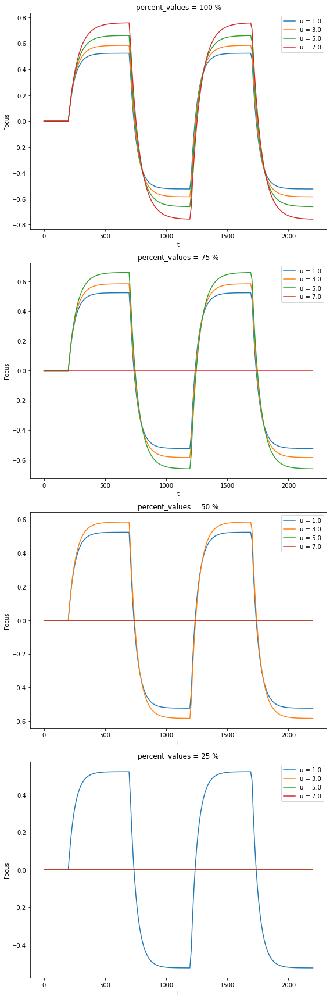

In [105]:
#comparation between different nb of biases with gamma = 0

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]
gamma = 0.0

# Lista dei valori di "u" da testare
percent_values = [100, 75, 50, 25]  

# Inizializza una lista vuota per i risultati
results = []

for percent in percent_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(percent_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(percent_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"percent_values = {percent_values[i]} %")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

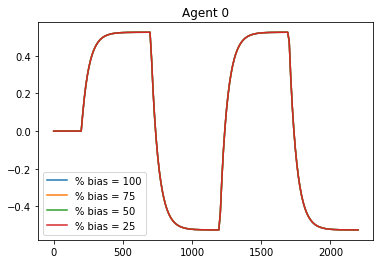

In [116]:
#comparation between different nb of biases

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]
gamma = 0.0

# Lista dei valori di "u" da testare
percent_values = [100, 75, 50, 25]  

# Inizializza una lista vuota per i risultati
results = []

for percent in percent_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y[0])) #CHANGE HERE THE AGENT

# Plotta i risultati
for i, (t, y) in enumerate(results):
    label = f"% bias = {percent_values[i]}"  #Crea una legenda con il valore di "u"
    plt.plot(t, y, label=label)
plt.title(f"Agent {0}")
    #plot_agent_tot(t, y, Na)

# Aggiungi una legenda al grafico
plt.legend()

# Mostra il grafico
plt.show()

In [30]:
gamma = 0.02
percent = 100

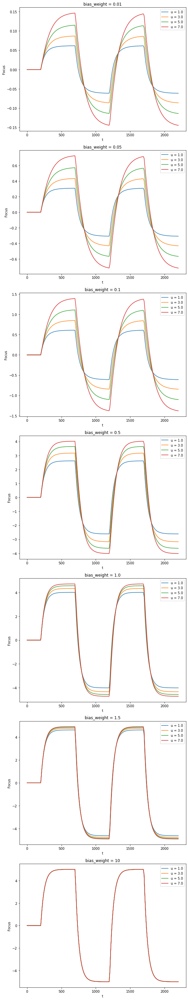

In [119]:
#comparation between different values of biases

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]
gamma = 0.02

# Lista dei valori di "u" da testare
bias_w_values = [0.01, 0.05, 0.1, 0.5, 1.0, 1.5, 10] 

# Inizializza una lista vuota per i risultati
results = []

for bias_w in bias_w_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(bias_w_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(bias_w_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"bias_weight = {bias_w_values[i]}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

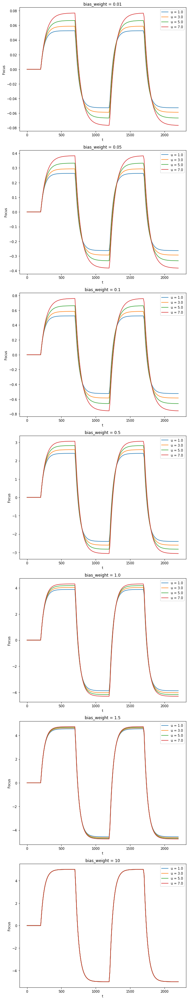

In [120]:
#comparation between different values of biases with gamma = 0.0

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]
gamma = 0.0

# Lista dei valori di "u" da testare
bias_w_values = [0.01, 0.05, 0.1, 0.5, 1.0, 1.5, 10] 

# Inizializza una lista vuota per i risultati
results = []

for bias_w in bias_w_values:
    A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
    zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
    zs.y = new_zs(zs.y, Na, No)
    results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = len(bias_w_values)
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(bias_w_values, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"bias_weight = {bias_w_values[i]}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

In [123]:
gamma = 0.02
bias_w = 0.1

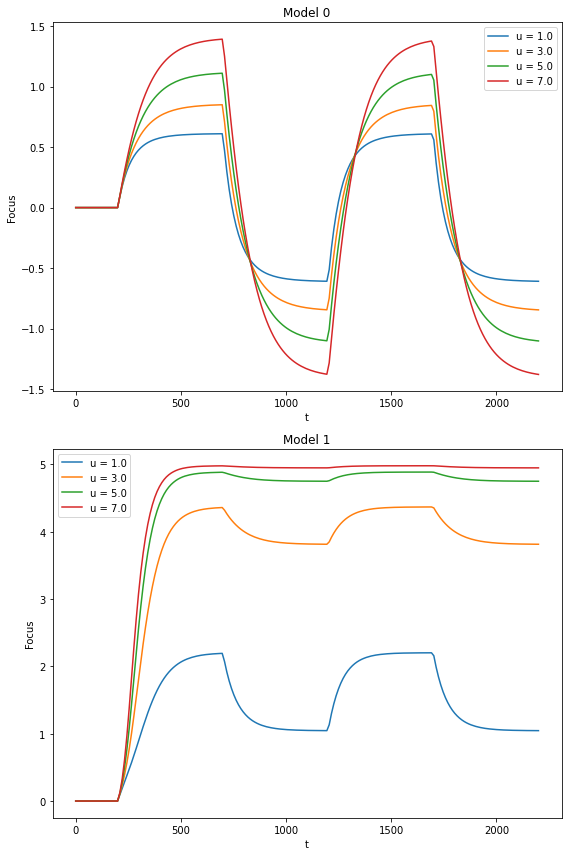

In [125]:
#comparation between model with normalization 1/Na or not

# Inizializza una lista vuota per i risultati
results = []
numb = [1,2]

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    #F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = 2
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(numb, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"Model {i}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

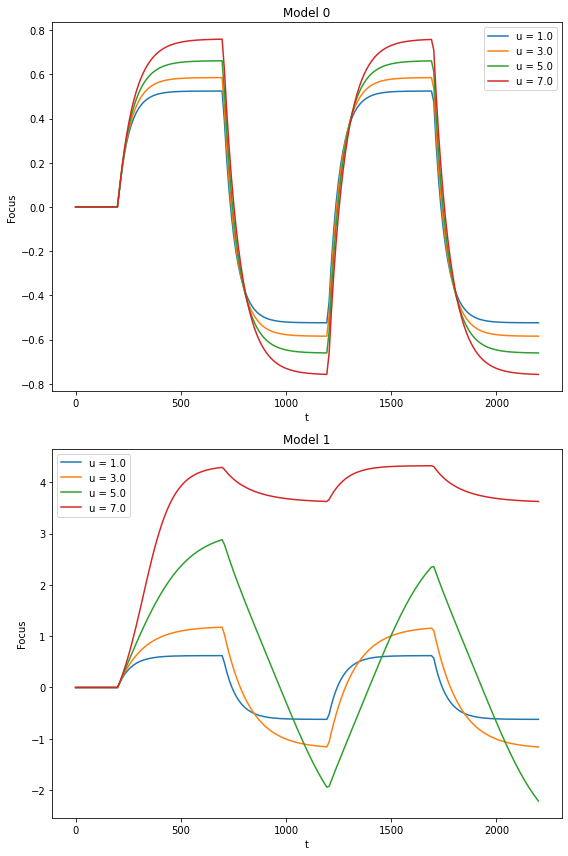

In [127]:
#comparation between model with normalization 1/Na or not with gamma = 0.0

gamma = 0.0
# Inizializza una lista vuota per i risultati
results = []
numb = [1,2]

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    #F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = 2
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(numb, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"Model {i}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

In [128]:
def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

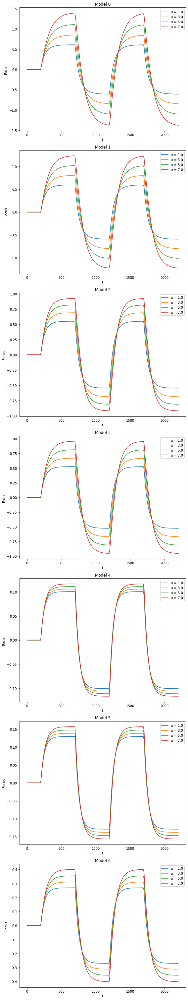

In [129]:
#comparation between model with different saturation functions

u  = np.array([1.0, 3.0, 5.0, 7.0]).repeat(2)
u_vector = [1.0, 3.0, 5.0, 7.0]
 
gamma = 0.02

# Inizializza una lista vuota per i risultati
results = []
numb = [1,1,1,1,1,1,1]

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return 0.5 * np.tanh(2*z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return 0.25 * np.tanh(4*z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y))


def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(x, u1):
        n = 1.0
        K = u1
        return (x ** n) / (K ** n + np.abs(x) ** n)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b, 1.0)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(x, u1):
        n = 1.0
        K = u1
        return (x ** n) / (K ** n + np.abs(x) ** n)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b, 5.0)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y))


def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(x, u1):
        a = 1.0/u1
        return 2 / (1 + np.exp(-a * x)) - 1

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b, 2.0)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y))

def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(x):
        return 2 / (1 + np.exp(-x)) - 1
    
    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz

A = build_A(Na, No, alpha, beta, gamma, delta, Ao, Aa)
zs = sim_net1(z1, T, Na, No, d, A, u, ue, rate, percent, value, times)
zs.y = new_zs(zs.y, Na, No)
results.append((zs.t, zs.y))

# Crea un subplot per ogni vettore di "u"
num_subplots = 7
fig, axs = plt.subplots(num_subplots, 1, figsize=(8, 6 * num_subplots))

# Plotta i risultati su ciascun subplot
for i, (u, (t, y)) in enumerate(zip(numb, results)):
    for j in range(Na):
        axs[i].plot(t, y[j], label=f"u = {u_vector[j]}")
    axs[i].set_title(f"Model {i}")
    axs[i].set_xlabel("t")
    axs[i].set_ylabel("Focus")
    axs[i].legend()

# Aggiungi spazi tra i subplot
plt.tight_layout()

# Mostra i subplot
plt.show()

In [130]:
def zdot_net1(t, z, Na, No, d, A, u1, u2, b):
    # Return an Error if Na and No don't match the dimensions of z
    if Na * No != len(z):
        return "Na, No must match dimensions of z"

    # Define same-option and inter-option saturation functions
    def S1(z):
        return np.tanh(z)

    # assemble intra-agent matrix (1)
    z = f_64(z)
    A = f_64(A)
    
    inds = np.kron(np.ones((Na, Na)), np.eye(No)) > 0
    A_SO = np.zeros((Na * No, Na * No))
    A_SO = f_64(A_SO)
    A_SO[inds] = A[inds]
    A_SO = A_SO   
    
    # assemble same-option interactions and bias (2)
    F = (np.dot(A_SO, z))
    #F = F / Na

    F2 = np.zeros_like(F)
    F2 = f_64(F2)
    # assemble inter-option interactions about option j (3)
    for j in range(No):
        A_j = np.zeros((Na * No, Na * No))
        ind_mat = np.zeros((No, No))
        ind_mat[:, j] = np.ones(No)
        ind_mat[j, j] = 0
        ind_mat2 = np.kron(np.ones((Na, Na)), ind_mat)
        A_j[ind_mat2 > 0] = A[ind_mat2 > 0]
        F2 += np.dot(A_j, z)
    #F2 = F2 / Na

    F = F + F2
    F = F / Na
    #F = - d * z + S1(u1 * F + b)
    F = - d * z + S1(np.multiply(u1, F) + b)
    F = F*( 1.0/tau)

    # variation of state vector z respect time
    #proj = np.eye(Na * No)
    #dz = np.dot(proj, F)
    dz = F
    #print(t, F)
    return dz